# Who has access to LA's parks?

Since the pandemic began, a person's ability to maintain good physical and mental health has become even more dependent on their access to outdoor spaces. 

Therefore, we want to know: **How accessible are parks and other public recreation facilities in the lowest income neighborhoods and highest income neighborhoods in Los Angeles, CA?**

Our hypothesis is that we will find fewer parks in lower income areas than the higher income areas.

We will explore this question by creating charts, static maps, and interactive maps to better understand the socioeconomic landscape of Los Angeles. Let's jump in!

<img src="https://studio-mla.com/wp-content/uploads/2017/09/Studio-MLA_Vista-Hermosa-10_Hunter-Kerhart_WEB.jpg" width=600>

## Data sources
We based our research on the following data sources:

[LA city income data from the U.S. Census Bureau](https://censusreporter.org/profiles/16000US0644000-los-angeles-ca/)

[Park data from the County of Los Angeles Department of Parks and Recreation](https://data.lacity.org/Community-Economic-Development/Department-of-Recreation-and-Parks-Facility-and-Pa/ax8j-dhzm)

## Importing the libraries
The first thing we need to do is import all of the libraries that will allow us to explore our data and create our beautiful charts and maps.

In [1]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon
import contextily as ctx

## Analyzing LA incomes by census tract
We will create 3 charts that will help us compare the median household per income of all LA census tracts. We will do this to identify which census tracts are of interest to us for our research. The charts we will create include:

- City of Los Angeles Census Tract Income Frequency
- Top 10 Census Tracts with Lowest Incomes in the City of Los Angeles
- Top 10 Census Tracts with Highest Incomes in the City of Los Angeles

### Importing the data
First we need to import our income data.

In [2]:
income1=pd.read_csv('Data1/Income_KB2_.csv')
income1.head()

,geoid,Census_Tract,Median_Household_Income,Median_Household_Income_<50K,Median_Household_Income_<100K,Median_Household_Income_<250K
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,NaN,NaN,250001.0
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,NaN,NaN,250001.0
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,NaN,NaN,250001.0
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,NaN,NaN,231250.0
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,NaN,NaN,224962.0


### Creating the charts
Now we can start to create our charts. 

We will be using a function to produce histogram charts for median household income of different income groups. In this case, the income groups are Median_Household_Income_<50K, Median_Household_Income_<100K, and Median_Household_Income_<250K.

In [3]:
def get_histogram(column = 'Median_Household_Income'):
    series_to_plot=income1[column]

    plt.figure(figsize=(10,5))

    plt.hist(series_to_plot,bins=50,color='skyblue')

    plt.axvline(series_to_plot.mean(), color='k', linestyle='dashed', linewidth=1)
    plt.axvline(series_to_plot.median(), color='r', linestyle='dashed', linewidth=1)
    min_ylim, max_ylim = plt.ylim()
    plt.text(series_to_plot.mean()*1.1, max_ylim*0.9, 'Mean: {:.2f}'.format(series_to_plot.mean()))
    plt.text(series_to_plot.median()*1.1, max_ylim*0.8, 'Median: {:.2f}'.format(series_to_plot.median()),color='r')
    plt.title(column + ' in Los Angeles')

In [4]:
indicators = [ 'Median_Household_Income','Median_Household_Income_<50K',
 'Median_Household_Income_<100K',
 'Median_Household_Income_<250K',]

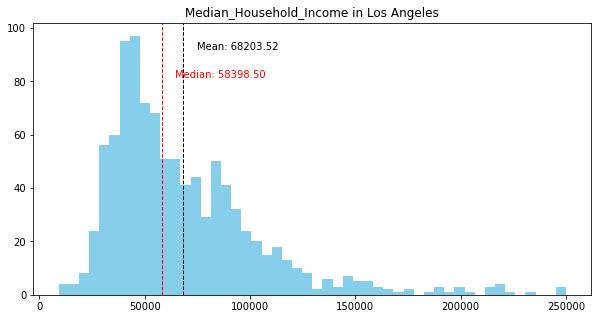

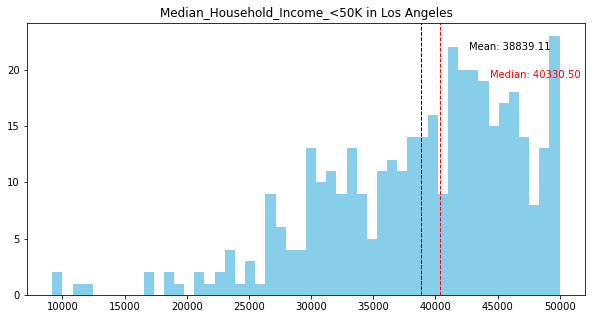

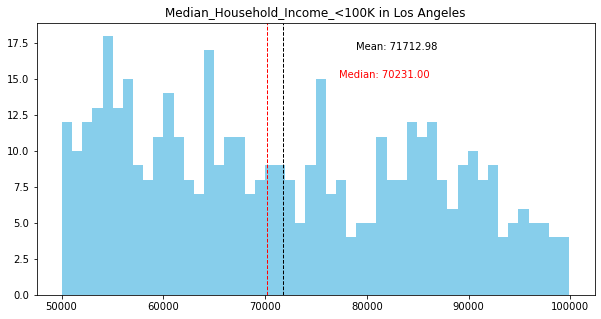

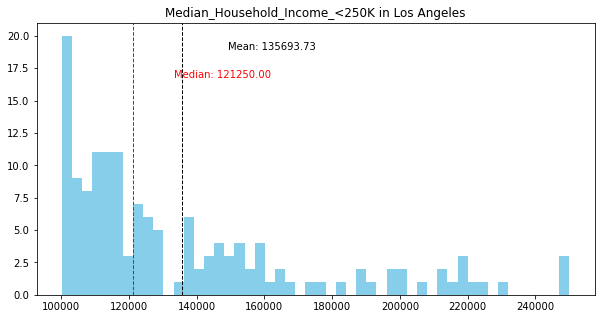

In [5]:
for indicator in indicators:
    get_histogram(column=indicator)

Wow!!! The histograms are really insightful in visually presenting the distribution of median household incomes of different census tracts. We can see the average income in each income bracket.

Now we want to get started on creating charts of the top 10 census tracts with the highest and lowest median household incomes. The first thing we need to do is to sort our data set by income and create variables that will store the sorted data. Then we can create an income bar chart of the lowest incomes.

In [6]:
lowest_incomes = income1.sort_values(by='Median_Household_Income',ascending = True)
highest_incomes = income1.sort_values(by='Median_Household_Income',ascending = False)

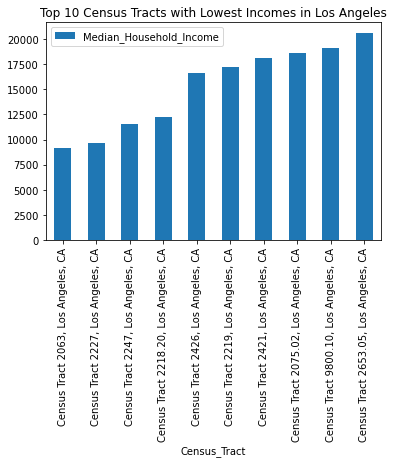

In [7]:
lowest_incomes.head(10).plot.bar(x='Census_Tract',
                            y='Median_Household_Income', 
                            title='Top 10 Census Tracts with Lowest Incomes in Los Angeles')

The output of our code is a chart titled "Top 5 Census Tracts with Lowest Incomes in the City of Los Angeles", which has census tracts in the x axis and median household income in the y axis. From this chart, we learn that the census tracts with the lowest median household incomes have incomes ranging from below 10,000 to slightly above 20,000.

Now we can make a chart for the highest incomes.

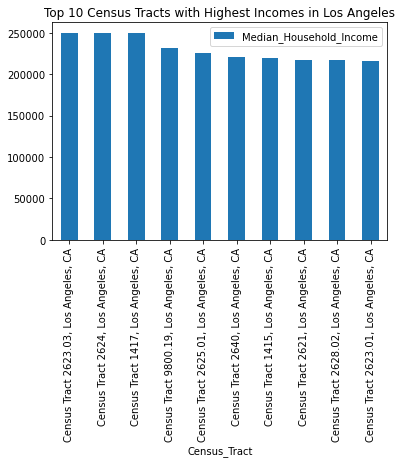

In [8]:
highest_incomes.head(10).plot.bar(x='Census_Tract',
                            y='Median_Household_Income', 
                            title='Top 10 Census Tracts with Highest Incomes in Los Angeles')

The output of our code is a chart titled "Top 5 Census Tracts with Highest Incomes in the City of Los Angeles", which has census tracts in the x axis and median household income in the y axis. From this chart we learn that the census tracts with the hgihest median household incomes have incomes around 250,000. 

All of these charts help us understand what the income distribution looks like between LA census tracts. With this information we can identify the high and low income census tracts and compare their park access.

## Mapping parks and income 
Perfect! Now that we have created our charts, the next thing we want to do is create interactive maps featuring park and income layers.

### Cleaning the Data
We need to do some data cleaning before we create the maps. Looking at the bottom of this chart we can see that there are some null values we want to get rid of.

In [9]:
income2=gpd.read_file('Data2/Income_KB.geojson')
columns_to_keep2 = ['geoid','name','B19013001','geometry']
income2 = income2[columns_to_keep2]
income2.columns = ['geoid',
 'Census_Tract',
 'Median_Household_Income',
 'geometry']
income2.head()

,geoid,Census_Tract,Median_Household_Income,geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."


Let's see how many null values there are.

In [10]:
lowest_incomes2 = income2.sort_values(by='Median_Household_Income',ascending = True)
lowest_incomes2.tail(15)

,geoid,Census_Tract,Median_Household_Income,geometry
340,14000US06037141700,"Census Tract 1417, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.45322 34.13557, -118.4531..."
831,14000US06037262303,"Census Tract 2623.03, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.49599 34.07105, -118.4959..."
832,14000US06037262400,"Census Tract 2624, Los Angeles, CA",250001.0,"MULTIPOLYGON (((-118.52146 34.11764, -118.5214..."
847,14000US06037265301,"Census Tract 2653.01, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.45549 34.07585, -118.4546..."
989,14000US06037980008,"Census Tract 9800.08, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.50267 34.22121, -118.5015..."
990,14000US06037980009,"Census Tract 9800.09, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361..."
992,14000US06037980014,"Census Tract 9800.14, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.26088 33.76850, -118.2602..."
995,14000US06037980020,"Census Tract 9800.20, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.34412 34.21700, -118.3438..."
996,14000US06037980021,"Census Tract 9800.21, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.40183 34.26509, -118.4017..."
997,14000US06037980022,"Census Tract 9800.22, Los Angeles, CA",NaN,"MULTIPOLYGON (((-118.50266 34.30809, -118.5026..."


Now we will get rid of the null values.

In [11]:
income2 = income2.drop([847, 989, 990, 992, 995, 996, 997, 998, 1000, 1001, 1002, 1003])

### Creating the static maps

Before we begin to create our interactive map, we should first create a nice static map of median household incomes. This will allow us to really visualize where the higher income and lower income communities are in Los Angeles. Having these communities in mind will help us be more intentional when we bring in our park data!

Text(0.5, 1.0, 'Census Tracts with median household incomes less than $125,000')

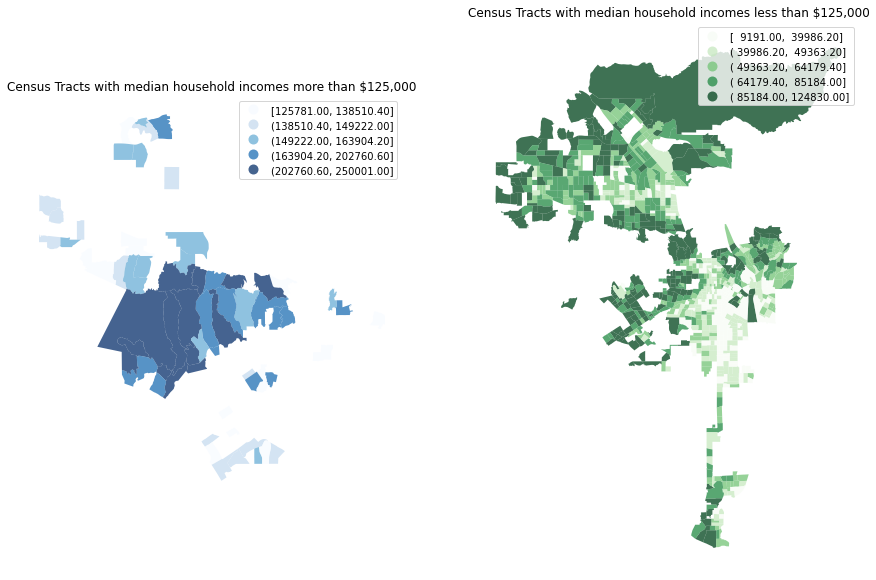

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(15, 12))

ax1, ax2 = axs

income2[income2.Median_Household_Income > 125000].plot(column='Median_Household_Income',
            cmap='Blues',
            scheme='quantiles',
            k=5,
            edgecolor='white',
            linewidth=0.,
            alpha=0.75,
            ax=ax1, # this assigns the map to the subplot,
            legend=True
           )

ax1.axis("off")
ax1.set_title("Census Tracts with median household incomes more than $125,000")

income2[income2.Median_Household_Income < 125000].plot(column='Median_Household_Income',
            cmap='Greens',
            scheme='quantiles',
            k=5,
            edgecolor='white',
            linewidth=0.,
            alpha=0.75,
            ax=ax2, # this assigns the map to the subplot
            legend=True
           )

ax2.axis("off")
ax2.set_title("Census Tracts with median household incomes less than $125,000")

TWO MAPS?!?! WOW! One map features the bottom half of median household incomes and one features the upper half of median household incomes in Los Angeles. These maps show that the higher income communities are concentrated in hills and valleys north west of Los Angeles. Conversely, the lower income communities are spread around Los Angeles, with the lowest incomes being in the South LA area.

### Creating the interactive map
Now we can get started on creating our interactive data maps! We will first make an interactive choropleth map that shades the census tracts according to how high or low their median household income is. We are able to hover over each census tract to see the census tract number.

In [13]:
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='OpenStreetMap', 
               attribution='CartoDB')

choropleth = folium.Choropleth(
                  geo_data=income2, 
                  data=income2,         
                  key_on='feature.properties.Census_Tract',
                  columns=['Census_Tract', 'Median_Household_Income'],
                  fill_color='YlOrRd',
                  line_weight=1, 
                  fill_opacity=0.8,
                  line_opacity=0.5, 
                  legend_name='Median Household Income per Census Tract (ACS 2019 5-Year Estimates)').add_to(m)   

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['Census_Tract'],labels=False)
)
m


How beautiful!! The census tracts with higher incomes have a darker red color. This color scheme is presented in the key in the top right.

Now let's add our parks and recreational facilities to our income layer.

In [14]:
parks = pd.read_csv('Data3/PR1.csv')
parks.head()

,LocationType,Location_Name,StNumber,StNumberFraction,StDirection,StName,StSuffix,StSuffixDirection,AddressType,AddressTypeValue,...,CrossStSuffix,CrossStSuffixDirection,City,State,Zip,Website,Phone,CouncilDistrict,X,Y
0,Parks,La Mirada Park Acquisition Site,5401.0,NaN,W,La Mirada,Ave,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90029\n(34.0942, -118.307)",CA,90029,NaN,(310) 548-7675,13,34.094208,-118.306999
1,Gardens,Drew St,3304.0,NaN,N,Drew,St,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90065\n(34.12, -118.243)",CA,90065,NaN,(213) 485-5572,13,34.119958,-118.242682
2,Parks,Avalon-San Pedro Park,4025.0,NaN,NaN,Avalon,Blvd,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90011\n(34.0104, -118.266)",CA,90011,NaN,(310) 548-7675,9,34.010389,-118.265542
3,Parks,11th Avenue Park,6116.0,NaN,NaN,11th,Ave,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90043\n(33.9845, -118.329)",CA,90043,NaN,(310) 548-7675,8,33.984488,-118.329232
4,Gardens,El Sereno Community Garden,5450.0,NaN,E,Huntington,Dr,NaN,NaN,NaN,...,NaN,NaN,"Los Angeles, CA 90032\n(34.0923, -118.162)",CA,90032,NaN,(213) 485-5572,14,34.092346,-118.161574


Now we can create our interactive map!

In [15]:
for index, row in parks.iterrows():
    tooltip_text = row.Location_Name
    folium.Marker(
        [row.X,row.Y], 
        popup=row.Location_Name, 
        tooltip=tooltip_text,
        icon=folium.Icon(color='green')
).add_to(m)

m

This map allows us to hover over each park marker to see the park name, and we can also hover over the census tracts to see the census tract number. It is helpful to visually compare the locations of the parks and recreational facilities to the high and low income census tracts.

### Merging the data
Now we will create a color coded interactive map of each of our census tracts showing the amount of parks and facilities located in them. We will start by projecting our park data and then joining it to our census data!

In [16]:
parks_listings = gpd.GeoDataFrame(parks,   geometry=gpd.points_from_xy(parks.Y, parks.X))
type(parks_listings)

geopandas.geodataframe.GeoDataFrame

In [17]:
parksss = parks_listings.set_crs("EPSG:4326")
incomepark = gpd.sjoin(income2,parksss)

Now that our data is projected and joined, we can group our data to create a count of how many parks are located in each census tract. 

In [18]:
grouped = incomepark.groupby('Census_Tract').size()
df = grouped.to_frame().reset_index()
df.columns = ['Census_Tract', 'listings_count']
df

,Census_Tract,listings_count
0,"Census Tract 1095, Los Angeles, CA",2
1,"Census Tract 1216, Los Angeles, CA",1
2,"Census Tract 1221.22, Los Angeles, CA",1
3,"Census Tract 1242.01, Los Angeles, CA",1
4,"Census Tract 1287.02, Los Angeles, CA",1
...,...,...
192,"Census Tract 2920, Los Angeles, CA",1
193,"Census Tract 2965, Los Angeles, CA",1
194,"Census Tract 7011, Los Angeles, CA",2
195,"Census Tract 9800.10, Los Angeles, CA",11


Let's add the listings count column to the rest of our spatial join data

In [19]:
merged = incomepark.merge(df, on='Census_Tract')
merged.head()

,geoid,Census_Tract,Median_Household_Income,geometry,index_right,LocationType,Location_Name,StNumber,StNumberFraction,StDirection,...,CrossStSuffixDirection,City,State,Zip,Website,Phone,CouncilDistrict,X,Y,listings_count
0,14000US06037109500,"Census Tract 1095, Los Angeles, CA",33387.0,"MULTIPOLYGON (((-118.45528 34.27935, -118.4552...",146,Outdoor Fitness Equipment,Fox & Laurel Park,14353.0,NaN,NaN,...,NaN,"Los Angeles, CA 91340\n(34.2716, -118.446)",CA,91340,NaN,NaN,7,34.271638,-118.446271,2
1,14000US06037109500,"Census Tract 1095, Los Angeles, CA",33387.0,"MULTIPOLYGON (((-118.45528 34.27935, -118.4552...",218,Parks,Fox & Laurel Park,14353.0,NaN,NaN,...,NaN,"Los Angeles, CA 91340\n(34.2716, -118.446)",CA,91340,NaN,NaN,7,34.271638,-118.446271,2
2,14000US06037121600,"Census Tract 1216, Los Angeles, CA",79474.0,"MULTIPOLYGON (((-118.41439 34.21985, -118.4129...",56,Parks,Bellaire Avenue Park,7960.0,NaN,N,...,NaN,"Los Angeles, CA 91605\n(34.2156, -118.413)",CA,91605,NaN,(818) 506-7456,2,34.215610,-118.412666,1
3,14000US06037122122,"Census Tract 1221.22, Los Angeles, CA",41811.0,"MULTIPOLYGON (((-118.37948 34.22330, -118.3774...",86,Swimming Pools - Summer,Sun Valley Park Pool,8123.0,NaN,NaN,...,NaN,"Los Angeles, CA 91352\n(34.2182, -118.37)",CA,91352,http://www.laparks.org/dos/aquatic/facility/su...,(818) 252-0835,6,34.218154,-118.370428,1
4,14000US06037124201,"Census Tract 1242.01, Los Angeles, CA",64364.0,"MULTIPOLYGON (((-118.37905 34.18853, -118.3790...",49,Parks,Victory - Vineland Park,11117.0,NaN,NaN,...,NaN,"Los Angeles, CA 91606\n(34.1869, -118.373)",CA,91606,http://www.laparks.org/dos/parks/facility/vict...,(818) 985-9516,2,34.186926,-118.372700,1


### Parks and recreation facilities per census tract map
Now that our data is projected, joined, merged etc, it is ready to be presented as a folium map! Like we mentioned earlier, our goal is to visually present the census tracts with the amount of parks and facilities that they contain.

In [20]:
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 10,
               tiles='OpenStreetMap', 
               attribution='CartoDB')

choropleth = folium.Choropleth(
                  geo_data=merged, 
                  data=merged,         
                  key_on='feature.properties.Census_Tract',
                  columns=['Census_Tract', 'listings_count'],
                  fill_color='YlGn',
                  line_weight=1, 
                  fill_opacity=0.8,
                  line_opacity=0.5, 
                  legend_name='Parks and Recreation Facilities Per Census Tract').add_to(m)   

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['Census_Tract'],labels=False)
)
m

## Conclusion
WOW!! What a journey! From our analysis we learned that: 
- many census tracts don't have any parks and facilities 
- the census tracts with 8 or more parks and facilities tend to have greater median household incomes compared to those with 7 or less parks and facilities
- the highest income areas (Beverly Hills and adjacent hills communities) have fewer parks

This iteration of our project has been very insightful towards our exploration of the relationship between parks and faciltiies and median household income. However, there are still more avenues we wish to explore. In the future we would like to use park quality data to determine if the parks located in lower income communities have a lower quality than those located in higher income communities. Unfortunately, we are currently experiencing some difficulty finding that data for each park in Los Angeles. 

Nonetheless, we are happy and confident with the current status of our project and look forward to the next iteration of this project. Thank you!

### Group division of labor
Brian Ramirez helped kickstart the project by acquiring the income census data and creating several insightful charts from the data. Kimberly Venegas found the park data and focused on creating the maps. Both of them worked together to improve what they each created and they helped each other solve issues that came up.

Group division of labor Week 7: Brian and Kim worked together to navigate how to implement a function and spatial join the data. After running into a wall, Kim discovered how to implement the function through the creation of the histograms and also created the last map above.